In [1]:
# @title iAAA Digital Image Processing: Session 1

from IPython.display import HTML

HTML('''
<div style="padding: 20px; background: linear-gradient(90deg, #a64ac9, #ff66b2); color: white; text-align: center; border-radius: 10px; font-size: 28px; font-weight: bold;">
  iAAA: Digital Image Processing Session 1
</div>
''')

### 📝 Notebook Topic: *Digital Image Processing: Session 1*  
👨‍🏫 Lecturer: *Soheil Tehrani Pour*  
📅 Date: *[2025-09-29]*

### In this notebook, we will practice the following topics step by step:
- A brief introduction and installing OpenCV  
- Reading, displaying, and saving an image  
- Resizing, cropping, rotating, and flipping  
- Introduction to color spaces (BGR, RGB, Gray, HSV) and `cv2.cvtColor`  
- Working with pixels and matrices in NumPy  
- Writing text and drawing on images  
- Final exercise: open an image, write text on it, and save the edited version

In [3]:
# @title Installing & Importing Libraries

from IPython.display import HTML

HTML('''
<div style="padding: 12px; background: linear-gradient(to right, #a64ac9, #ff66b2); color: white; font-size: 20px; font-weight: bold; border-radius: 8px; margin-top: 20px;">
  💻 Installing & Importing Libraries
</div>
''')

In [ ]:
!pip install opencv-python numpy matplotlib pillow

In [14]:
import sys
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
# @title Section 1: General Information of packages and libraries
from IPython.display import HTML

HTML('''
<div style="padding: 12px; background: linear-gradient(to right, #c471ed, #f7797d); color: white; font-size: 22px; border-radius: 8px; margin-top: 20px;">
  📘 Section 1: General Information of packages and libraries
</div>
''')

In [6]:
print(sys.executable)

/usr/bin/python3


In [7]:
print(os.getcwd())

/content


In [8]:
print (cv2.__version__)

4.12.0


In [9]:
# @title Section 2: Image importing & basic information
from IPython.display import HTML

HTML('''
<div style="padding: 12px; background: linear-gradient(to right, #c471ed, #f7797d); color: white; font-size: 22px; border-radius: 8px; margin-top: 20px;">
  📘 Section 2: Image importing & basic information
</div>
''')

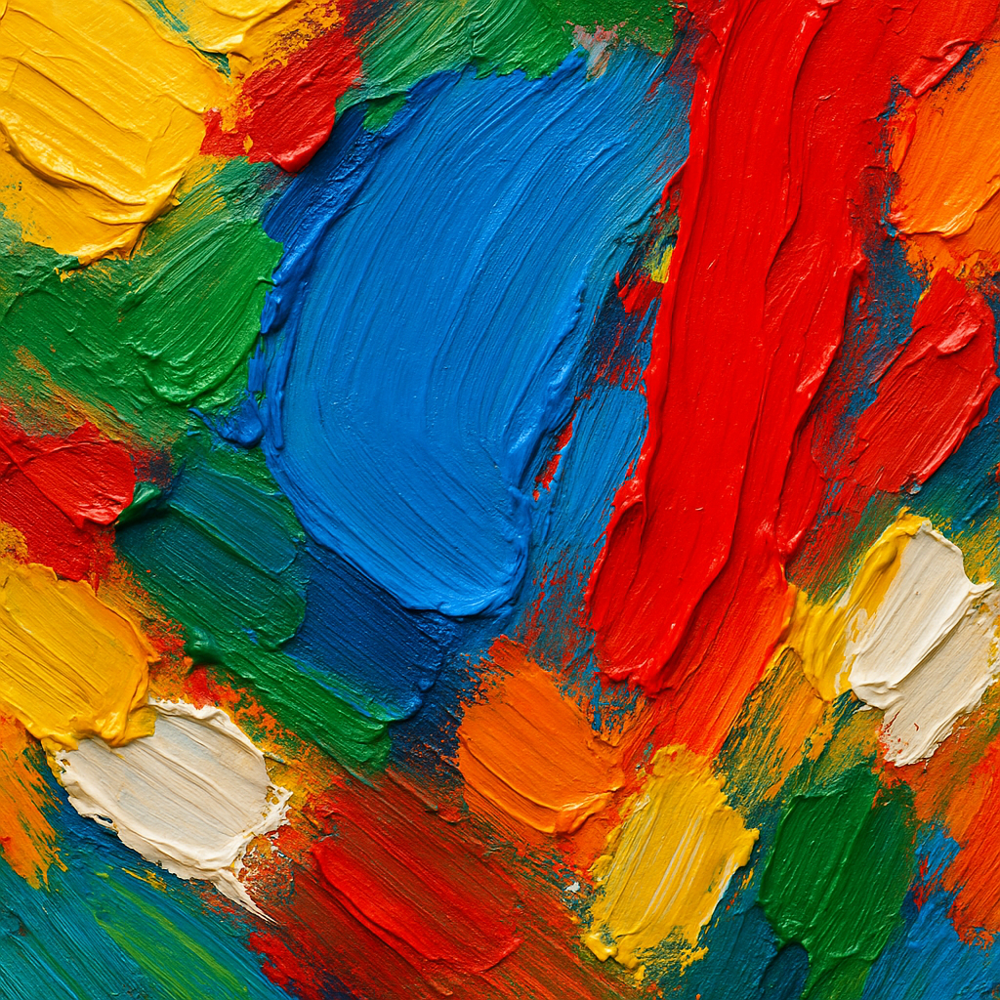

In [15]:
# We don't need to do this again, but it's a good habit
import cv2
from google.colab.patches import cv2_imshow

# Load an image using 'imread' specifying the path to image
img = cv2.imread('input.png')

# The first parameter will be title shown on image window
# The second parameter is the image varialbe
cv2_imshow(img)

# 'waitKey' allows us to input information when a image window is open
# By leaving it blank it just waits for anykey to be pressed before
# continuing. By placing numbers (except 0), we can specify a delay for
# how long you keep the window open (time is in milliseconds here)
cv2.waitKey()

# This closes all open windows
# Failure to place this may cause your program to hang in some computers!
cv2.destroyAllWindows()

In [16]:
type(img)

numpy.ndarray

### `shape` shows the dimensions of the image.

The first two values represent the **height** and **width** of the image, respectively.  
The number `3` indicates that the image has **three color channels**.

In [17]:
print(img.shape)

(1024, 1024, 3)


In [18]:
# Let's print each dimension of the image

print ('Height of Image:', int(img.shape[0]), 'pixels')
print ('Width of Image: ', int(img.shape[1]), 'pixels')

Height of Image: 1024 pixels
Width of Image:  1024 pixels


In [19]:
# Simply use 'imwrite' specificing the file name and the image to be saved
cv2.imwrite('output.jpg', img)
cv2.imwrite('output.png', img)

True

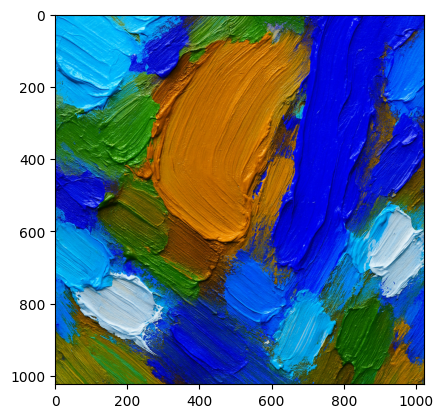

In [20]:
plt.imshow(img)

In fact, the **rows** and **columns** of the matrix correspond to the **height** and **width** of the image, respectively.  

The image colors may look inverted because the channel order in OpenCV is **BGR** (Blue, Green, Red) rather than the more common **RGB** order used in most other libraries.

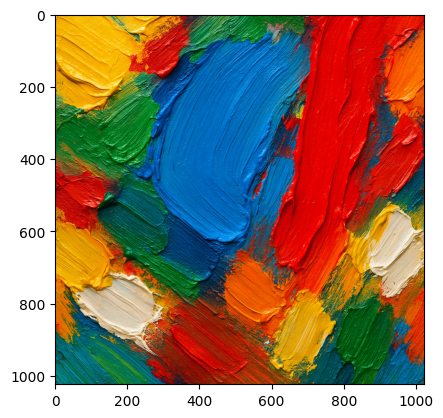

In [21]:
#method1
plt.imshow(img[:,:,::-1])

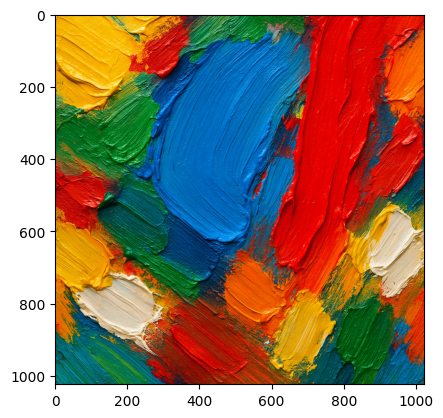

In [22]:
#method2
rgb_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(rgb_image)

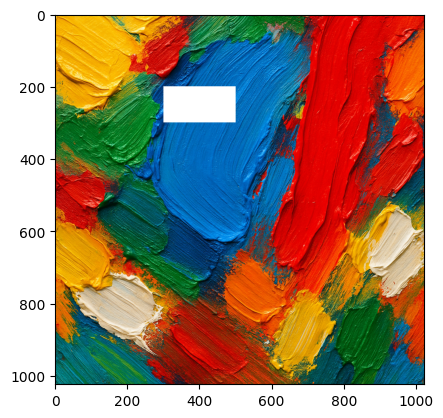

In [23]:
img[200:300,300:500,:] = 255
plt.imshow(img[...,::-1])

In [24]:
# @title Section 3: Pixels manipulation
from IPython.display import HTML

HTML('''
<div style="padding: 12px; background: linear-gradient(to right, #c471ed, #f7797d); color: white; font-size: 22px; border-radius: 8px; margin-top: 20px;">
  📘 Section 3: Pixels manipulation
</div>
''')

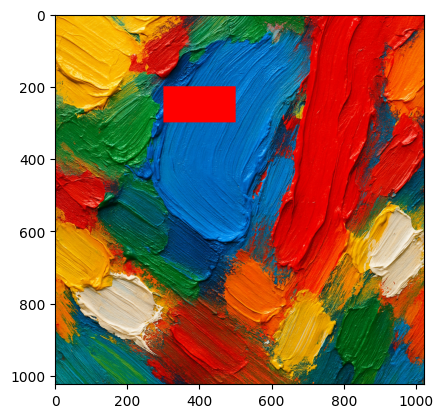

In [25]:
img[200:300,300:500,:] = (0, 0, 255)
plt.imshow(img[...,::-1])

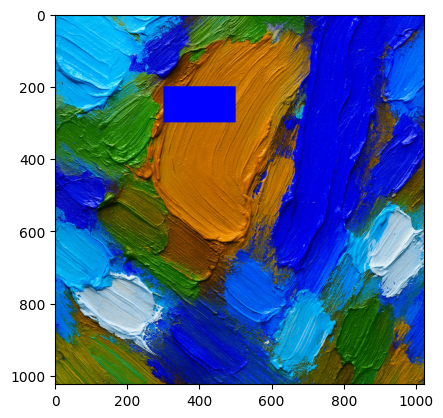

In [26]:
plt.imshow(img, cmap='gray')

In [27]:
#Let's look at the individual color levels for the first pixel (10,50)
B, G, R = img[10, 50]
print (B, G, R)
print ("shape:", img.shape)

2 185 249
shape: (1024, 1024, 3)


In [28]:
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print (gray_img[10, 50])
print ("shape:", gray_img.shape)

183
shape: (1024, 1024)


Cropping

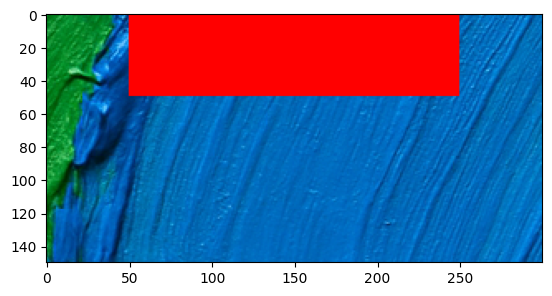

In [29]:
height, width = img.shape[:2]

# Simply use indexing to crop out the rectangle we desire
cropped = img[250:400 , 250:550]

plt.imshow(cropped[...,::-1])

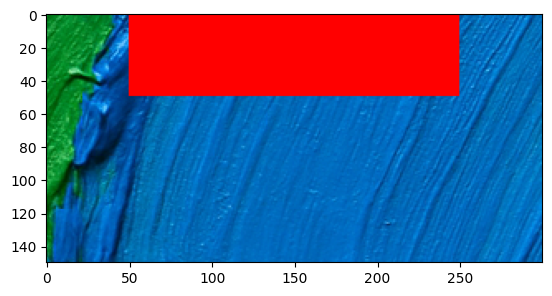

In [30]:

height, width = img.shape[:2]

# Simply use indexing to crop out the rectangle we desire
cropped = img[250:400 , 250:550]

plt.imshow(cropped[...,::-1])

In [31]:

import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def imshow_cv(img, title=None):
    """Display an image (BGR or Gray) correctly inside Jupyter using matplotlib."""
    plt.figure()
    if img is None:
        raise ValueError("Image is None, check your file path.")
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        # Convert BGR (OpenCV default) to RGB for correct colors in matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

print(cv2.__version__)


4.12.0


## Preparing a Sample Image (Optional)

To ensure everyone can practice without needing an external file, we will create a sample image and save it to the path `data/sample_photo.png`.  
You can later replace this path with your own image if you wish.

In [32]:

os.makedirs('data', exist_ok=True)
sample_path = 'data/sample_photo.png'

# Create a simple synthetic image with Pillow (works even if cv2 not used here)
W, H = 640, 400
img_pil = Image.new('RGB', (W, H), (235, 240, 245))
draw = ImageDraw.Draw(img_pil)

# Draw gradient-like rectangles
for i in range(0, W, 20):
    shade = 180 + (i // 20) % 60
    draw.rectangle([i, 0, i+10, H], fill=(shade, 200, 220))

# Decorative shapes
draw.rectangle([40, 40, 280, 180], outline=(20, 120, 200), width=6)
draw.ellipse([360, 80, 580, 300], outline=(200, 60, 80), width=8)
draw.line([(0, H-60), (W, H-60)], fill=(100, 100, 100), width=3)

# Optional text (fallback font)
draw.text((50, 320), "OpenCV Session 1 — Sample", fill=(40, 40, 40))

img_pil.save(sample_path)

print("Sample image saved at:", sample_path)


Sample image saved at: data/sample_photo.png


In [33]:

IMAGE_PATH = 'data/sample_photo.png'  # مسیر پیش‌فرض (تصویر نمونه)
# IMAGE_PATH = '/path/to/your/image.jpg'  # مسیر تصویر خودتان
assert os.path.exists(IMAGE_PATH), "Image path does not exist!"


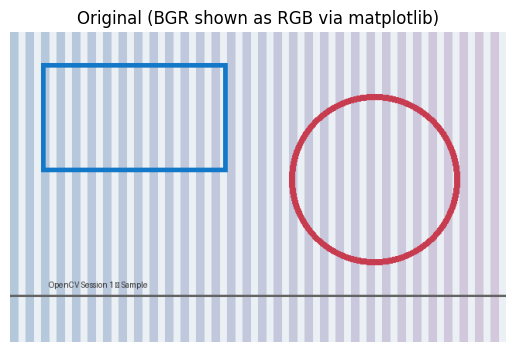

Saved a copy to: data/output_copy.png


In [34]:

img = cv2.imread(IMAGE_PATH)  # BGR
imshow_cv(img, title="Original (BGR shown as RGB via matplotlib)")

out_path = 'data/output_copy.png'
cv2.imwrite(out_path, img)
print("Saved a copy to:", out_path)


## Resizing, Cropping, Rotating, and Flipping

- **Resizing** with `cv2.resize`  
- **Cropping** using NumPy array slicing  
- **Rotating** with `cv2.getRotationMatrix2D` + `cv2.warpAffine`  
- **Flipping** with `cv2.flip`  

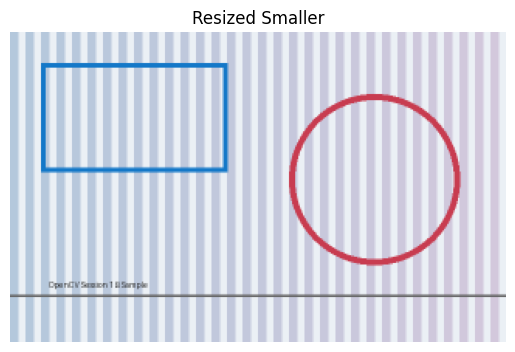

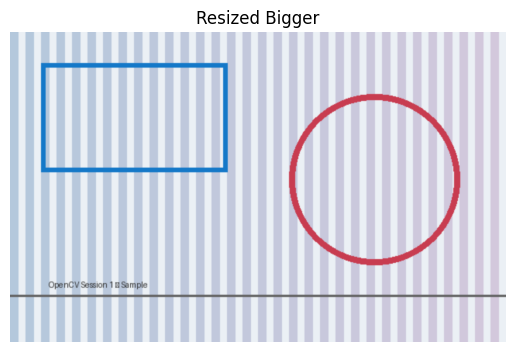

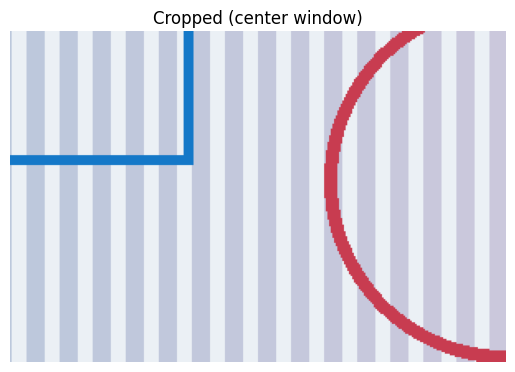

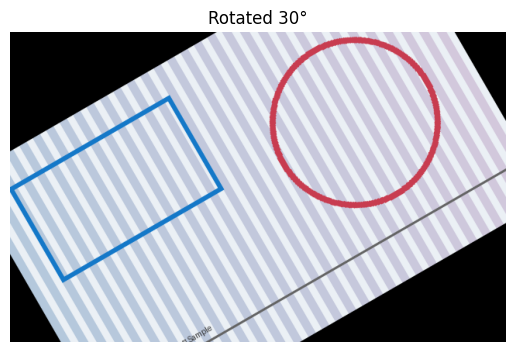

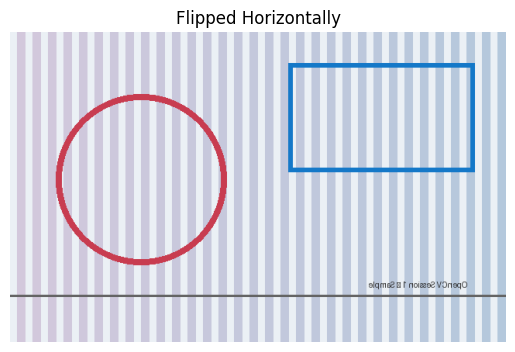

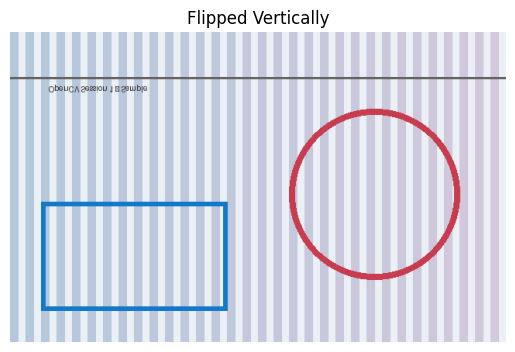

In [35]:

# Resize
resized_small = cv2.resize(img, (320, 200), interpolation=cv2.INTER_AREA)
resized_big   = cv2.resize(img, (img.shape[1]*2, img.shape[0]*2), interpolation=cv2.INTER_LINEAR)
imshow_cv(resized_small, title="Resized Smaller")
imshow_cv(resized_big, title="Resized Bigger")

# Crop (center crop)
h, w = img.shape[:2]
ch, cw = h//2, w//2
crop = img[ch-100:ch+100, cw-150:cw+150]  # 200x300 window
imshow_cv(crop, title="Cropped (center window)")

# Rotate (e.g., 30 degrees around center)
M = cv2.getRotationMatrix2D((w/2, h/2), 30, 1.0)
rotated = cv2.warpAffine(img, M, (w, h))
imshow_cv(rotated, title="Rotated 30°")

# Flip (0: vertical, 1: horizontal, -1: both)
flipped_h = cv2.flip(img, 1)
flipped_v = cv2.flip(img, 0)
imshow_cv(flipped_h, title="Flipped Horizontally")
imshow_cv(flipped_v, title="Flipped Vertically")


## Color Spaces and `cv2.cvtColor`

- OpenCV stores images in the **BGR** color space by default.  
- We will practice converting images to **Gray** and **HSV**.  
- We will also explore how to split the individual **B**, **G**, and **R** channels.  

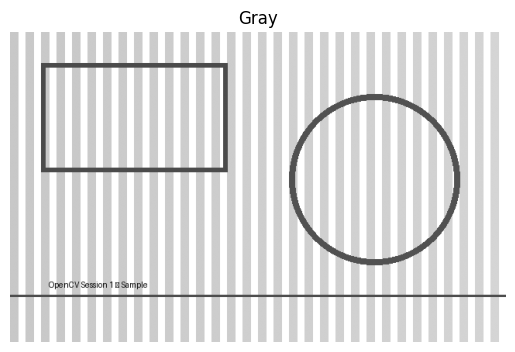

HSV shape: (400, 640, 3) dtype: uint8


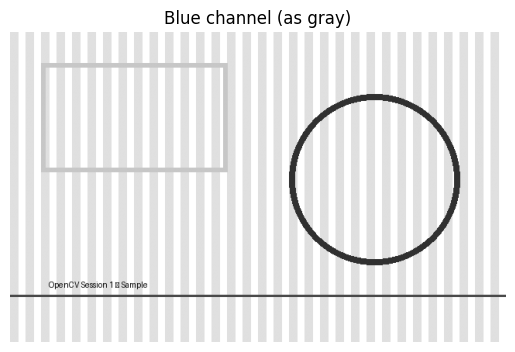

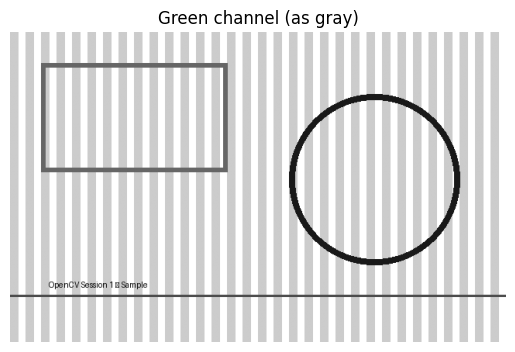

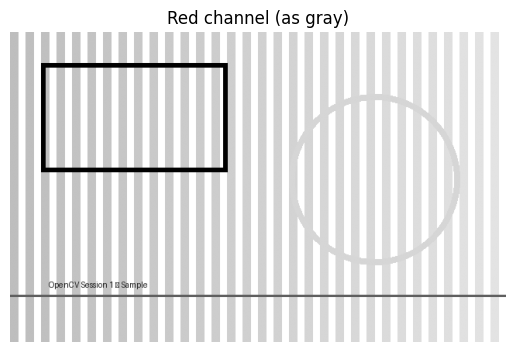

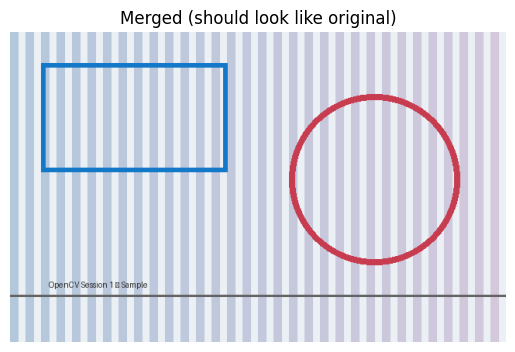

In [36]:

# Convert to Gray and HSV
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
hsv  = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

imshow_cv(gray, title="Gray")
# برای نمایش HSV در matplotlib باید به RGB تبدیل کنیم؛ اما اینجا به‌صورت اطلاعاتی نشان می‌دهیم:
print("HSV shape:", hsv.shape, "dtype:", hsv.dtype)

# Split channels
b, g, r = cv2.split(img)
imshow_cv(b, title="Blue channel (as gray)")
imshow_cv(g, title="Green channel (as gray)")
imshow_cv(r, title="Red channel (as gray)")

# Merge back
merged = cv2.merge([b, g, r])
imshow_cv(merged, title="Merged (should look like original)")


## More about RGB(or BGR) images

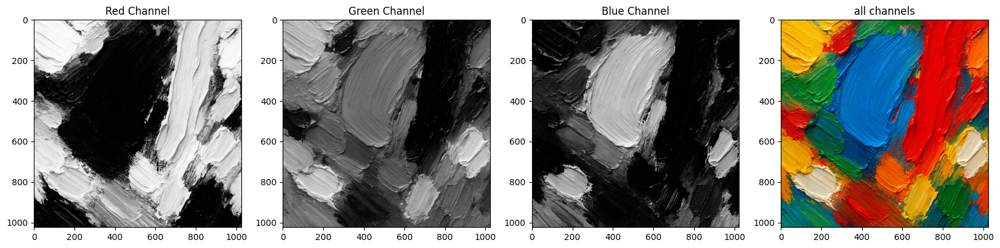

In [37]:
# Split the image into the B,G,R components
img = cv2.imread("input.png")
b,g,r = cv2.split(img)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(r,cmap='gray');plt.title("Red Channel");
plt.subplot(142);plt.imshow(g,cmap='gray');plt.title("Green Channel");
plt.subplot(143);plt.imshow(b,cmap='gray');plt.title("Blue Channel");

# Show the original image
plt.subplot(144);plt.imshow(img[:,:,::-1]);plt.title("all channels");

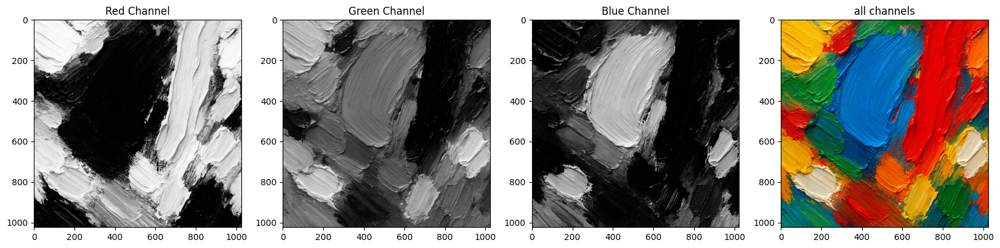

In [38]:
# Split the image into the B,G,R components
img = cv2.imread("input.png")
b,g,r = cv2.split(img)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(r,cmap='gray');plt.title("Red Channel");
plt.subplot(142);plt.imshow(g,cmap='gray');plt.title("Green Channel");
plt.subplot(143);plt.imshow(b,cmap='gray');plt.title("Blue Channel");

# Show the original image
plt.subplot(144);plt.imshow(img[:,:,::-1]);plt.title("all channels");

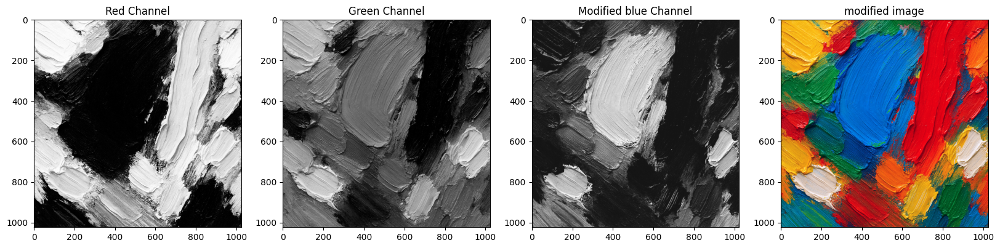

In [39]:
# Let's re-make the original image,
modified_b = b+20
merged = cv2.merge([modified_b, g, r])
# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(r,cmap='gray');plt.title("Red Channel");
plt.subplot(142);plt.imshow(g,cmap='gray');plt.title("Green Channel");
plt.subplot(143);plt.imshow(modified_b,cmap='gray');plt.title("Modified blue Channel");

# Show the original image
plt.subplot(144);plt.imshow(merged[:,:,::-1]);plt.title("modified image");

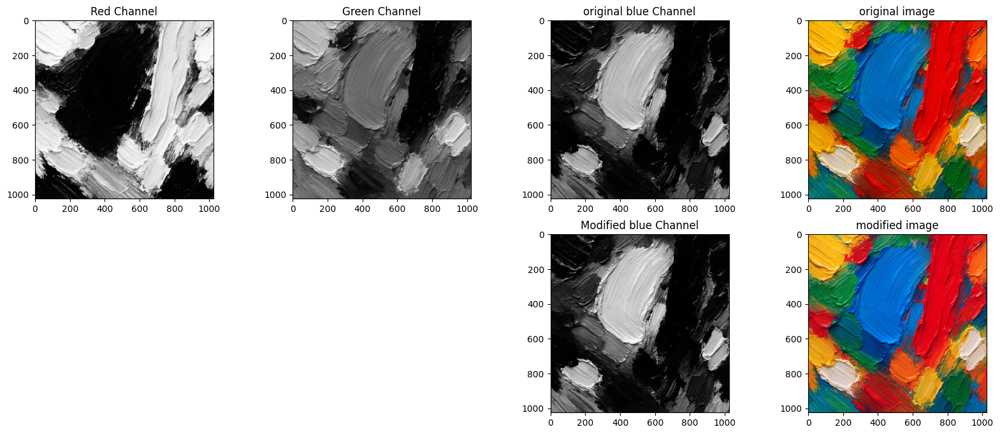

In [40]:
# Let's re-make the original image,
modified_b = b.astype('int16') + 20
modified_b = np.minimum(modified_b, 255)
modified_b = modified_b.astype('uint8')

merged = cv2.merge([modified_b, g, r])
# Show the channels
plt.figure(figsize=[20,8])
plt.subplot(241);plt.imshow(r,cmap='gray');plt.title("Red Channel");
plt.subplot(242);plt.imshow(g,cmap='gray');plt.title("Green Channel");
plt.subplot(243);plt.imshow(b,cmap='gray');plt.title("original blue Channel");
plt.subplot(244);plt.imshow(img[:,:,::-1]);plt.title("original image");

# Show the modified channel and image
plt.subplot(247);plt.imshow(modified_b,cmap='gray');plt.title("Modified blue Channel");
plt.subplot(248);plt.imshow(merged[:,:,::-1]);plt.title("modified image");


In [41]:
assert np.all(modified_b == cv2.add(b, 20))

### Another Useful Color Space: HSV

- **Hue (H):** Represents the color type, ranging from `0 – 179`.  
- **Saturation (S):** Represents the vibrancy of the color, ranging from `0 – 255`.  
- **Value (V):** Represents the brightness or intensity of the color, ranging from `0 – 255`.  

![HSV Color Cylinder](https://miro.medium.com/v2/resize:fit:1400/1*W30TLUP9avQwyyLfwu7WYA.jpeg)

HSV is especially useful for **color filtering** because it separates color information (Hue) from intensity (Value), making it easier to isolate specific colors under different lighting conditions.

#### You can view a list of color converisons here, but keep in mind you won't ever use or need many of these

https://docs.opencv.org/4.6.0/d8/d01/group__imgproc__color__conversions.html

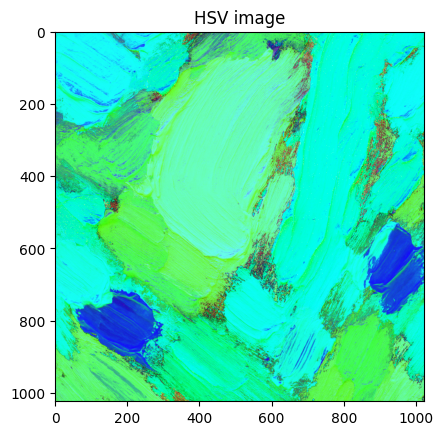

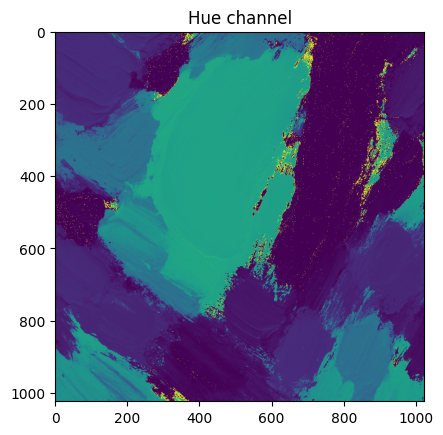

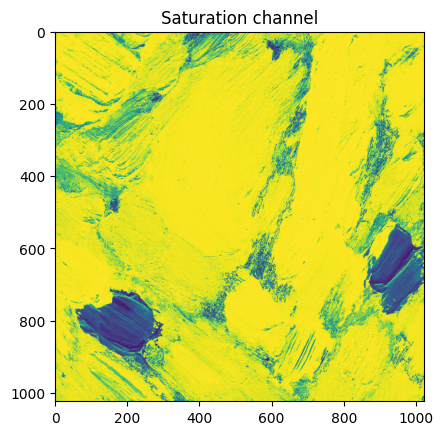

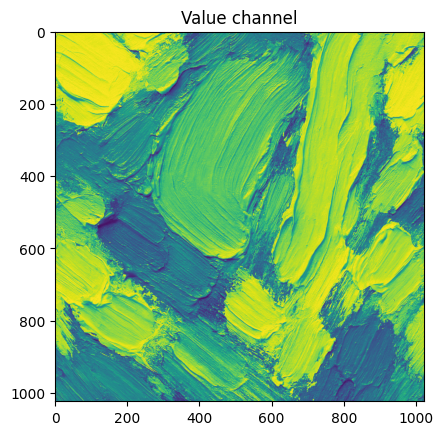

In [51]:
hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

plt.imshow(hsv_image);plt.title('HSV image');
plt.show()
plt.imshow(hsv_image[:, :, 0]);plt.title('Hue channel');
plt.show()
plt.imshow(hsv_image[:, :, 1]);plt.title('Saturation channel');
plt.show()
plt.imshow(hsv_image[:, :, 2]);plt.title('Value channel');
plt.show()

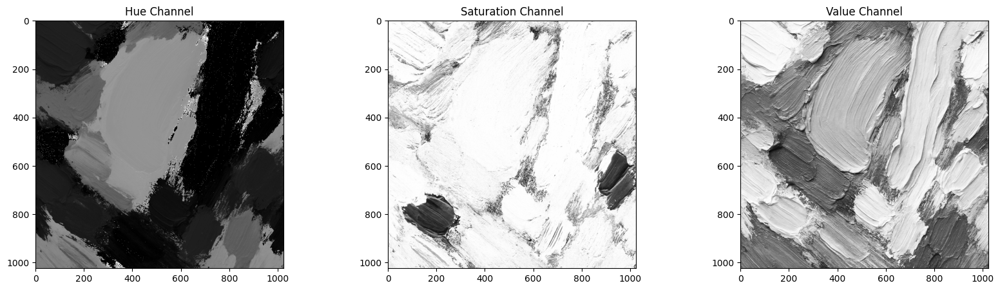

In [52]:
# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(131);plt.imshow(hsv_image[:, :, 0],cmap='gray');plt.title("Hue Channel");
plt.subplot(132);plt.imshow(hsv_image[:, :, 1],cmap='gray');plt.title("Saturation Channel");
plt.subplot(133);plt.imshow(hsv_image[:, :, 2],cmap='gray');plt.title("Value Channel");


Text(0.5, 1.0, 'original image')

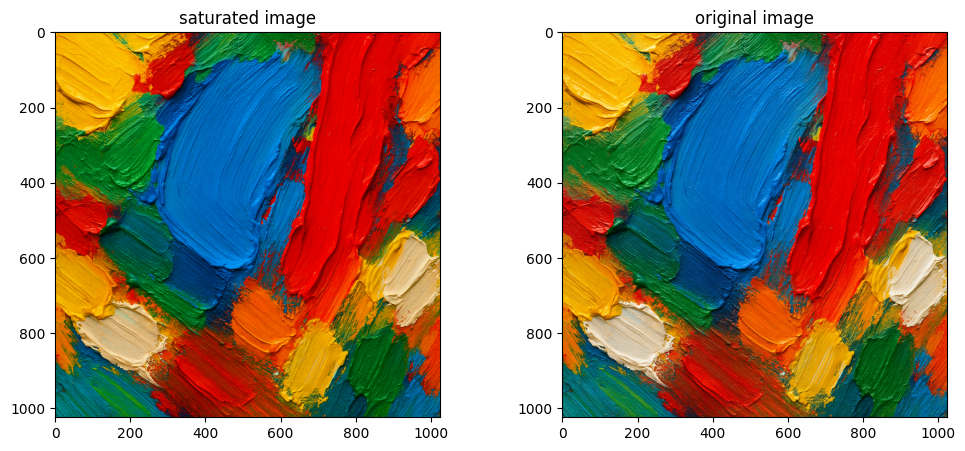

In [53]:
saturated_image = cv2.merge([hsv_image[:, :, 0], cv2.add(hsv_image[:, :, 1], 50), hsv_image[:, :, 2]])
saturated_image = cv2.cvtColor(saturated_image, cv2.COLOR_HSV2BGR)

plt.figure(figsize=[12,5])

plt.subplot(121)
plt.imshow(saturated_image[...,::-1])
plt.title('saturated image')

plt.subplot(122)
plt.imshow(img[...,::-1])
plt.title('original image')



Text(0.5, 1.0, 'original image')

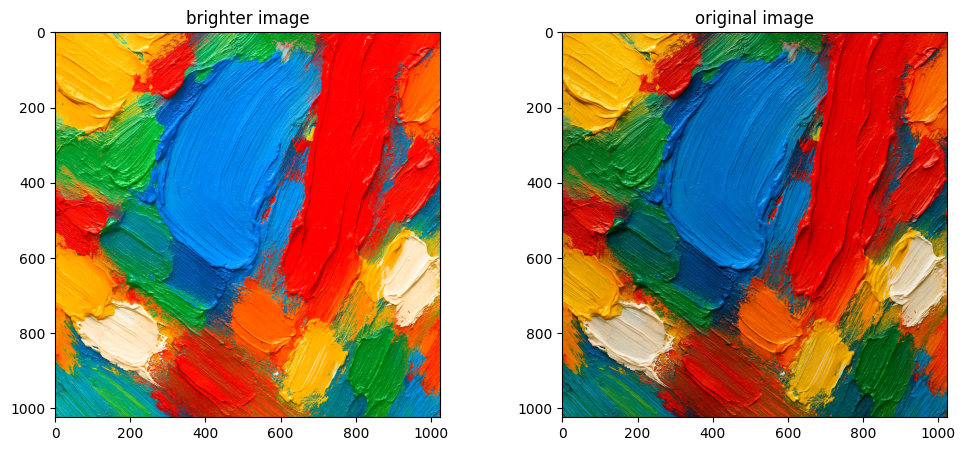

In [54]:
brighter_image = cv2.merge([hsv_image[:, :, 0], hsv_image[:, :, 1], cv2.add(hsv_image[:, :, 2], 50)])
brighter_image = cv2.cvtColor(brighter_image, cv2.COLOR_HSV2BGR)

plt.figure(figsize=[12,5])

plt.subplot(121)
plt.imshow(brighter_image[...,::-1])
plt.title('brighter image')

plt.subplot(122)
plt.imshow(img[...,::-1])
plt.title('original image')



## Working with Pixels and Matrices in NumPy

- Understanding the **shape**, **data type**, and **value range** of an image  
- **Reading and writing** individual pixel values  
- **Modifying a specific region** of the image with a constant value  

Shape: (1024, 1024, 3) | dtype: uint8 | min-max: (np.uint8(0), np.uint8(255))
Pixel before: [  1 179 254]
Pixel after : [  0   0 255]


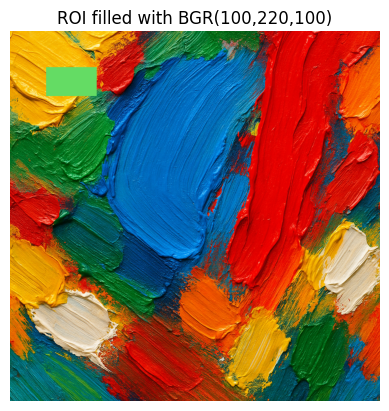

In [55]:

print("Shape:", img.shape, "| dtype:", img.dtype, "| min-max:", (img.min(), img.max()))

# Access & set a single pixel (row=y, col=x, channel)
y, x = 50, 50
print("Pixel before:", img[y, x])  # BGR
img[y, x] = (0, 0, 255)            # set to red in BGR
print("Pixel after :", img[y, x])

# Set a rectangular ROI to a constant color (light green)
roi = img.copy()
roi[100:180, 100:240] = (100, 220, 100)
imshow_cv(roi, title="ROI filled with BGR(100,220,100)")


## Drawing Shapes and Adding Text

- `cv2.line` – Draw a line  
- `cv2.rectangle` – Draw a rectangle  
- `cv2.circle` – Draw a circle  
- `cv2.putText` – Write text on the image  

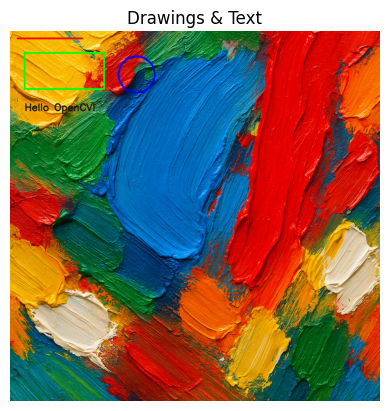

In [57]:

canvas = img.copy()

# Line
cv2.line(canvas, (20, 20), (200, 20), (0, 0, 255), thickness=3)

# Rectangle
cv2.rectangle(canvas, (40, 60), (260, 160), (0, 255, 0), thickness=3)

# Circle
cv2.circle(canvas, (350, 120), 50, (255, 0, 0), thickness=4)

# Text
cv2.putText(canvas, "Hello OpenCV!", (40, 220), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (20, 20, 20), 2, cv2.LINE_AA)

imshow_cv(canvas, title="Drawings & Text")


## Final Exercise

1. Open an image.  
2. Write a custom text on the image (for example, your name and the date).  
3. Save the edited version to the path `data/edited_output.png`.  

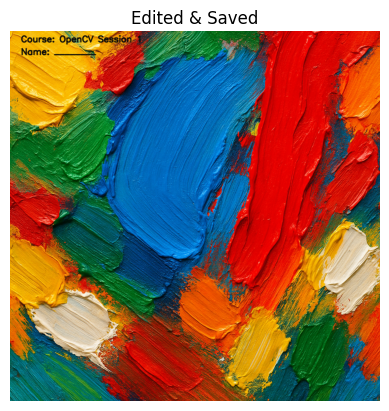

Saved edited image to: data/edited_output.png


In [58]:

edited = img.copy()
text = "Course: OpenCV Session 1"
cv2.putText(edited, text, (30, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (10, 10, 10), 2, cv2.LINE_AA)
cv2.putText(edited, "Name: ________", (30, 65), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (10, 10, 10), 2, cv2.LINE_AA)

save_path = 'data/edited_output.png'
cv2.imwrite(save_path, edited)
imshow_cv(edited, title="Edited & Saved")
print("Saved edited image to:", save_path)


In [59]:
# @title 🎓End of Notebook – Thank You!
from IPython.display import HTML

HTML('''
<div style="margin-top: 40px; padding: 16px; background: linear-gradient(90deg, #ff66b2, #a64ac9); color: white; text-align: center; border-radius: 10px; font-size: 18px;">
  🎓 <strong>End of Notebook – Thank You!</strong>
</div>
''')